## Grad-cam for Binary Classification
### This notebook was written by Salma on March 08, then modified by Mariam on August 16,2021.

In [1]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2
from pathlib import Path
from PIL import Image

from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Input, Flatten, Dense, BatchNormalization, Dropout,LeakyReLU
from tensorflow.keras.models import Model, model_from_json

from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import classification_report, confusion_matrix


from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg19 import VGG19
from keras.layers.convolutional import Conv2D, MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten
import efficientnet.tfkeras as efc

from keras import backend as K


import tensorflow as tf
import numpy as np
import keras
import cv2
import os
import matplotlib.pyplot as plt
%matplotlib inline


import glob
tf.compat.v1.disable_eager_execution()
K.clear_session()
tf.keras.backend.clear_session()
#from keras.models import load_model




Using TensorFlow backend.


In [2]:
pip install --no-cache-dir --no-build-isolation efficientnet

You should consider upgrading via the '/home/salka/.conda/envs/myenv/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
print("version of tensorflow is {}".format(tf.__version__))
print("version of keras is {}".format(keras.__version__))


#Create "heatmaps" folder if it does not exist
try:
    if not os.path.exists('heatmaps'):
        os.makedirs('heatmaps')
except OSError:
    print ('Error: Creating directory of data')

import sys

test_dir = '/home/marmia/snic2020-6-41/Mariam/Mariam_Thesis/Results_Pipelines_Images/Binary_Classifier_data/Objects_split/Test'
#sys.path.append('/home/salka/.conda/envs/cam_grad_env/lib/python3.6/site-packages')


combined_heatmap = 0
combined_img = 0

#######################################

def load_image(path):
    #img_path = sys.argv[1]
    img = image.load_img(path, target_size=(224, 224))
    x = image.img_to_array(img)
    #x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x





version of tensorflow is 2.1.0
version of keras is 2.3.1


In [3]:


Image_size = (224,224,3)

efnet = efc.EfficientNetB7(input_shape = Image_size , weights = 'imagenet', include_top = False)
efnet.summary()




#to prevent training existing weights
for layer in efnet.layers:
        layer.trainable = False

#build the model architecture again. change it according to the model loaded
x = efnet.input
y = efnet.output # a vector with a size of 2 for each image (2 probabilities)
y = Flatten(name = 'flatten')(y)
#normaliza the input to the neural network to speed up training
y = BatchNormalization()(y)
y = Dense(32, name = 'FC1')(y)
y = LeakyReLU()(y)
y = Dropout(0.2)(y)
z = y
#y = Dense(512, activation='relu', name = 'FC2')(y)
#y = Dropout(0.5)(y)
y = Dense(2, activation = 'softmax', name = 'prediction')(y)
model = Model(inputs = x, outputs = y)
#print(weights[0])
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Load weights, select between best_weights (val_accuracy) and final_weights from last epoch
model.load_weights('/home/marmia/snic2020-6-41/Mariam/Mariam_Thesis/Notebooks_Master/trainings/trainings/train_augmentation/model9_effnetB7_modified/round2/model.32-0.99.h5')

layer_dict = dict([(layer.name, layer) for layer in model.layers])




    





Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "efficientnet-b7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
stem_conv (Conv2D)              (None, 112, 112, 64) 1728        input_1[0][0]                    
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (None, 112, 112, 64) 256         stem_conv[0][0]                  
__________________________________________________________________________________________________
stem_activation (Activation)    (None, 112, 112, 64) 0           stem_bn[0][0]                    
___

block5i_se_squeeze (GlobalAvera (None, 1344)         0           block5i_activation[0][0]         
__________________________________________________________________________________________________
block5i_se_reshape (Reshape)    (None, 1, 1, 1344)   0           block5i_se_squeeze[0][0]         
__________________________________________________________________________________________________
block5i_se_reduce (Conv2D)      (None, 1, 1, 56)     75320       block5i_se_reshape[0][0]         
__________________________________________________________________________________________________
block5i_se_expand (Conv2D)      (None, 1, 1, 1344)   76608       block5i_se_reduce[0][0]          
__________________________________________________________________________________________________
block5i_se_excite (Multiply)    (None, 14, 14, 1344) 0           block5i_activation[0][0]         
                                                                 block5i_se_expand[0][0]          
__________

In [4]:
##Input test images#############################################
img_path =sorted(glob.glob(test_dir + '/*'))



layer_name = 'top_conv'
filter_index = 0  # can be any integer from 0 to 511, as there are 512 filters in that layer

last_conv_layer = model.get_layer(layer_name).output 
predictions     = model.output
#InputLayer has no attribute to get_layer



loss = predictions[:,1]#K.mean(last_conv_layer[:, :, :, :])
print(loss)



# colocate_gradients_with_ops=False
# compute the gradient of the input picture wrt this loss
grads = K.gradients(loss, last_conv_layer)[0]
print(grads)
    # This is a vector of shape (512,), where each entry
    # is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))
#last_conv_layer = model.get_layer("block5_conv3") ##SHOULD BE specific for model used

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.layers[0].input], [pooled_grads, last_conv_layer[0]])

Tensor("strided_slice:0", shape=(None,), dtype=float32)
Tensor("gradients/top_bn/cond_grad/Identity_2:0", shape=(None, 7, 7, 2560), dtype=float32)


123


/home/marmia/mariam-env/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


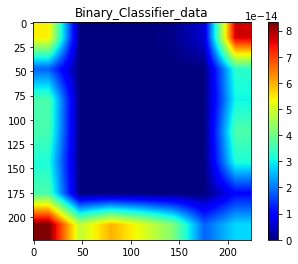

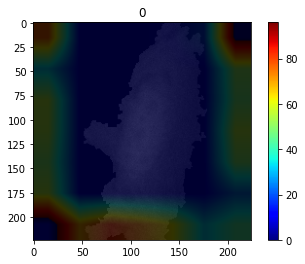

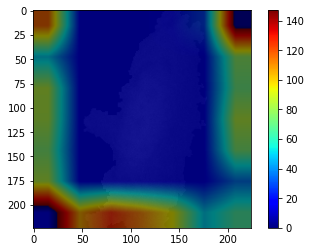

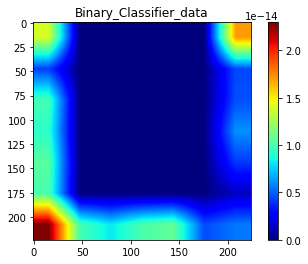

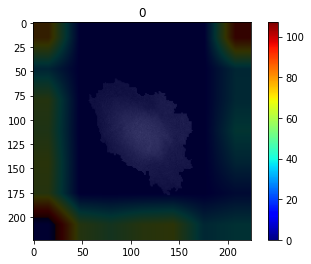

...

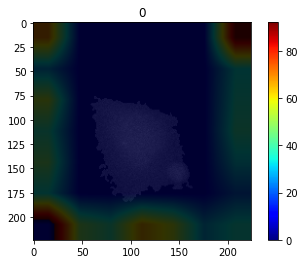

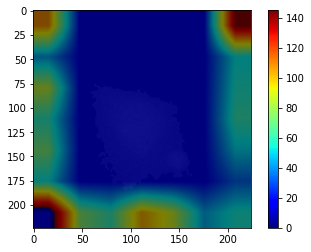

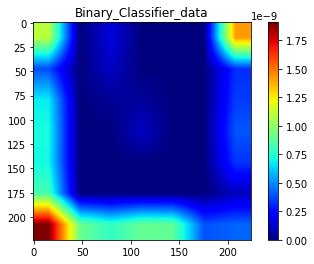

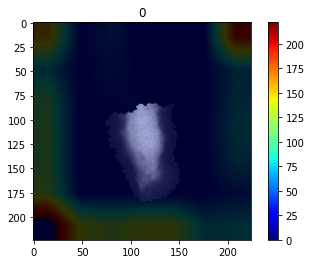

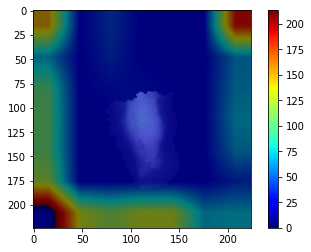

<Figure size 432x288 with 0 Axes>

In [31]:
# These are the values of these two quantities, as Numpy arrays,

img_dir = test_dir
print(len(img_path))
short_img_path = img_path[0:]
for img_ in short_img_path:
    input_img = cv2.imread(img_)
    input_img = cv2.resize(input_img,(224,224))
    y = np.expand_dims(input_img, axis=0)
    #plt.imshow(input_img)
    plt.title(img_.split("/")[7])
    

 
    pooled_grads_value, conv_layer_output_value = iterate([y])
  

    for i in range(2560): 
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

    # The channel-wise mean of the resulting feature map
    # is our heatmap of class activation
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    pos_heat = heatmap>0
    heatmap = pos_heat * heatmap
    heatmap = cv2.resize(heatmap,(224,224))
    heatmap = np.maximum(heatmap, 0)
    heatmap_n= cv2.normalize(heatmap, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    pos_heat = heatmap_n>0
    heatmap_n*=pos_heat
    #print(heatmap_n)
    #print(np.min(heatmap))
    #print(np.max(heatmap))
    #print(np.max(heatmap_n))
    
    
    plt.imshow(np.float32(heatmap),cmap = 'jet')
    plt.colorbar()
    plt.figure()
    #plt.title(img_.split("/")[10])
    #plt.show()

    # We apply the heatmap to the original image
    cam = cv2.applyColorMap(225-heatmap_n,cv2.COLORMAP_JET)
    new_img = cv2.addWeighted(np.float32(cam), 0.5, np.float32(input_img), 0.5, 0)
                              
    cam = 0.2*np.float32(cam)+np.float32(input_img)
    plt.title(np.argmax(model.predict(y)))
    
    plt.imshow(np.uint8(cam),cmap = 'jet')
    plt.colorbar()
    plt.figure()
    
    plt.imshow(np.uint8(new_img),cmap = 'jet')
    plt.colorbar()
    plt.figure()
    
#     plt.imshow(np.uint8(input_img),cmap='gray')
#     plt.colorbar()
#     plt.figure()
    
    
